In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [1]:
# Let's use WSERV7 and see how it goes.

%run ../variability_selection.py
%run ../brown_dwarf_selection.py

from wuvars.data.photometry import v1 as phot
from wuvars.data.photometry import v1_grouped as phot_grouped
from wuvars.data.spreadsheet import v1 as spread

Loading WSERV1 photometry data... Grouping... 

KeyboardInterrupt: 

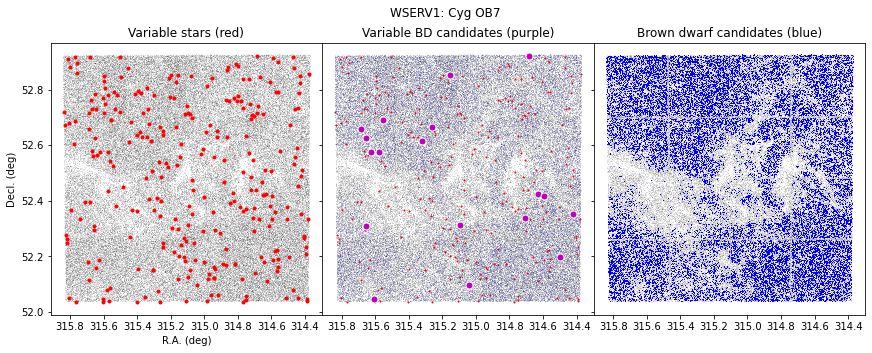

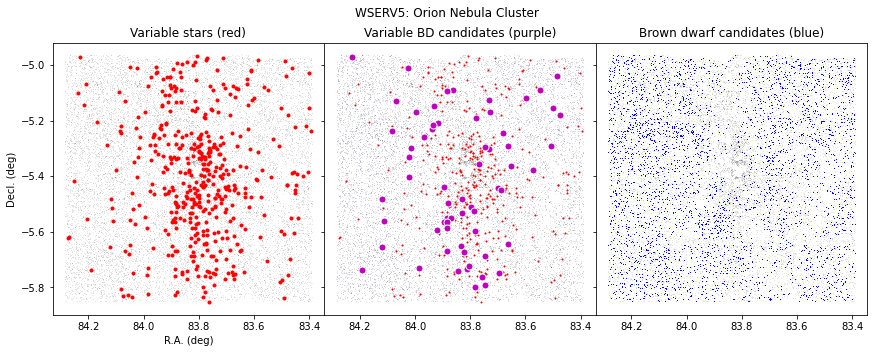

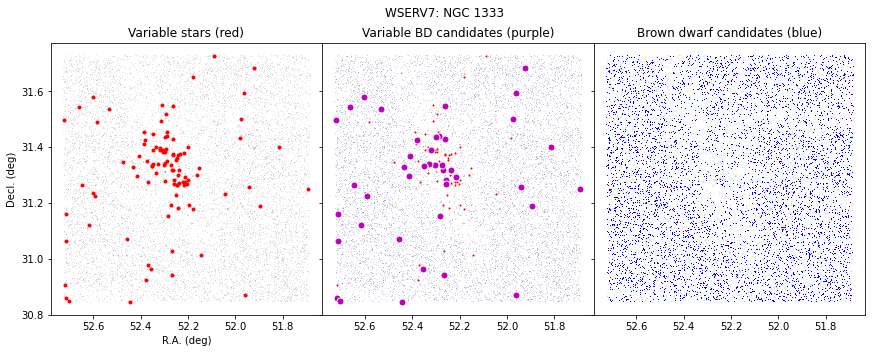

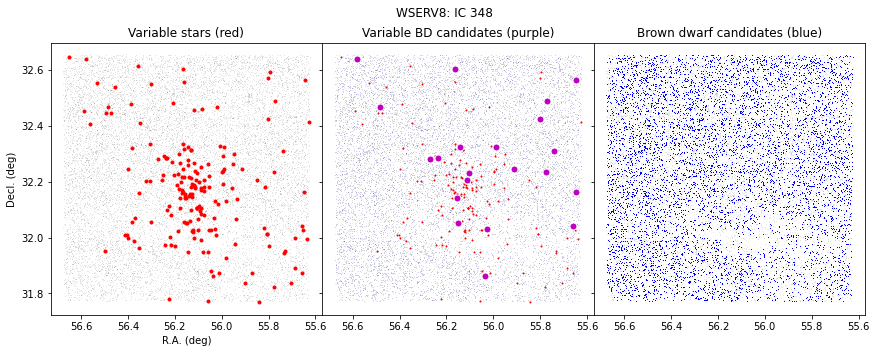

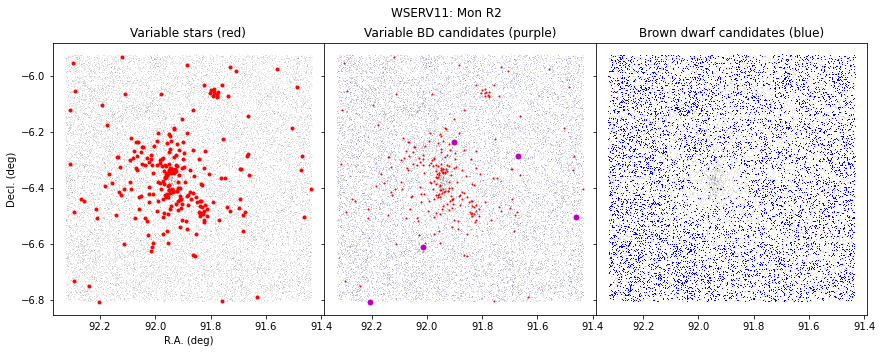

In [61]:
wserv_ids = [1, 5, 7, 8, 11]

# n_obs_list = [130, 120, 171, 85, 110]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

min_Stetson_list = [2, 3, 1.6, 1.6, 4]

SFR_names = ["Cyg OB7", "Orion Nebula Cluster", "NGC 1333", "IC 348", "Mon R2"]
SFR_dict = {x: y for x, y in zip(wserv_ids, SFR_names)}

for wserv, n_min, n_max, S in list(zip(wserv_ids, n_min_list, n_max_list, min_Stetson_list)):
    
    ds = spread[f'wserv{wserv}']

    q0 = sq0(ds, n_min, n_max)
    q1 = sq1(ds, n_min, n_max)
    q2 = sq2(ds, n_min, n_max)
    
    v0 = sq0_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v1 = sq1_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v2 = sq2_variables(ds, n_min, n_max, Stetson_cutoff=S)
    
    bd = simple_BD_select_v2(ds, wserv)

    
    fig, axes = plt.subplots(ncols=3, figsize=(14.6,5), sharex=True, sharey=True)
    
    for ax in axes:
        
        ax.plot(np.degrees(ds[q0]['mean']['RA']), np.degrees(ds[q0]['mean']['DEC']), 'k,', alpha=0.1)
        ax.invert_xaxis()
        
    axes[0].plot(np.degrees(ds[v1]['mean']['RA']), np.degrees(ds[v1]['mean']['DEC']), 'r.')

    axes[1].plot(np.degrees(ds[v1]['mean']['RA']), np.degrees(ds[v1]['mean']['DEC']), 'r.', ms=2)
    axes[1].plot(np.degrees(ds[q1 & bd]['mean']['RA']), np.degrees(ds[q1 & bd]['mean']['DEC']), 'b,', alpha=0.1)
    axes[1].plot(np.degrees(ds[v1 & bd]['mean']['RA']), np.degrees(ds[v1 & bd]['mean']['DEC']), 'mo', markeredgecolor='w', ms=7)

    axes[2].plot(np.degrees(ds[q1 & bd]['mean']['RA']), np.degrees(ds[q1 & bd]['mean']['DEC']), 'b,')
    
    fig.suptitle(f"WSERV{wserv}: {SFR_dict[wserv]}")
    
    axes[0].set_title("Variable stars (red)")
    axes[1].set_title("Variable BD candidates (purple)")
    axes[2].set_title("Brown dwarf candidates (blue)")
    
    axes[0].set_xlabel("R.A. (deg)")
    axes[0].set_ylabel("Decl. (deg)")

    plt.subplots_adjust(wspace=0)
    


WSERV1 Q1 brown dwarf candidates: 24705
WSERV1 Q1 brown dwarf candidates that are variable: 19

WSERV5 Q1 brown dwarf candidates: 3646
WSERV5 Q1 brown dwarf candidates that are variable: 64

WSERV7 Q1 brown dwarf candidates: 5925
WSERV7 Q1 brown dwarf candidates that are variable: 43

WSERV8 Q1 brown dwarf candidates: 7000
WSERV8 Q1 brown dwarf candidates that are variable: 21

WSERV11 Q1 brown dwarf candidates: 7978
WSERV11 Q1 brown dwarf candidates that are variable: 5



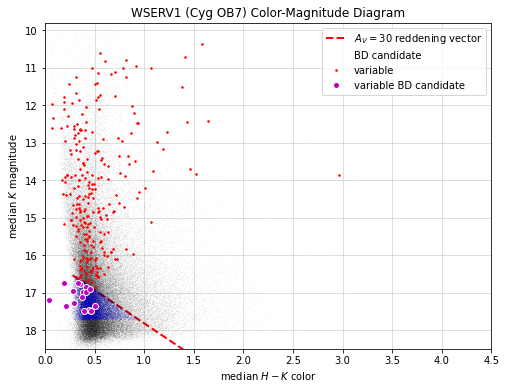

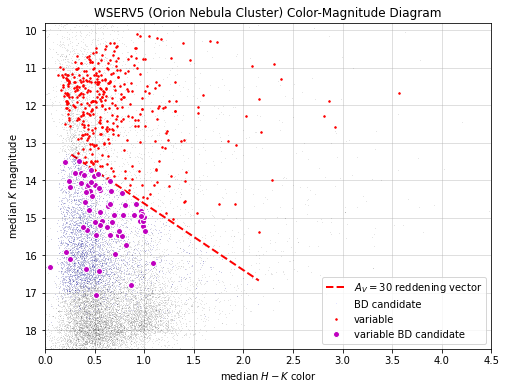

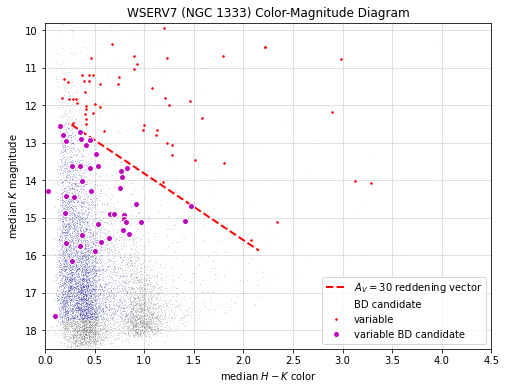

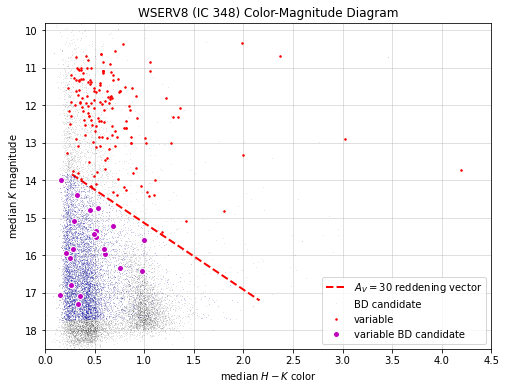

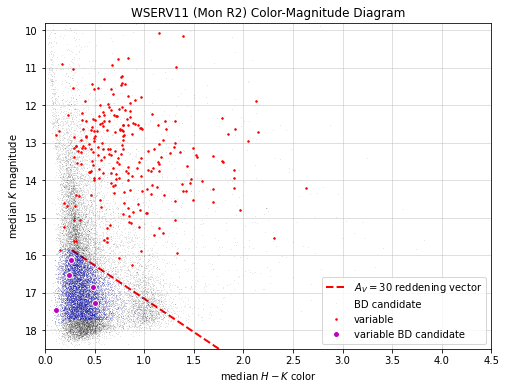

In [59]:
import matplotlib.pyplot as plt
from wuvars.analysis.bd_mags import apparent_BD_mags_jhk

spreadsheet_root = "/Users/tsrice/Documents/Variability_Project_2020/wuvars/Data/analysis_artifacts"
wserv_ids = [1, 5, 7, 8, 11]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

min_Stetson_list = [2, 3, 1.6, 1.6, 4]

SFR_names = ["Cyg OB7", "Orion Nebula Cluster", "NGC 1333", "IC 348", "Mon R2"]
SFR_dict = {x: y for x, y in zip(wserv_ids, SFR_names)}

for wserv, n_min, n_max, S in list(zip(wserv_ids, n_min_list, n_max_list, min_Stetson_list)):
        
    ds = spread[f'wserv{wserv}']

    q0 = sq0(ds, n_min, n_max)
    q1 = sq1(ds, n_min, n_max)
    q2 = sq2(ds, n_min, n_max)
    
    v0 = sq0_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v1 = sq1_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v2 = sq2_variables(ds, n_min, n_max, Stetson_cutoff=S)
    
    bd = simple_BD_select_v2(ds, wserv)

    # rieke & lebofsky 1985 reddening law
    A_K = 0.112
    A_H = 0.175
    E_HK = A_H - A_K # this is like a slope in color-mag space
    
    J_BDlimit = apparent_BD_mags_jhk[wserv][0]
    H_BDlimit = apparent_BD_mags_jhk[wserv][1]
    K_BDlimit = apparent_BD_mags_jhk[wserv][2]

    fig, ax = plt.subplots(1, figsize=(8,6))
    
    h = ds['median']['HAPERMAG3']
    k = ds['median']['KAPERMAG3']
    hmk = h-k
    
    h_e = ds['median']['HAPERMAG3ERR']
    k_e = ds['median']['KAPERMAG3ERR']
    hmk_e = (h_e**2 + k_e**2)**0.5
    
    hmk_limit = 19 - k
    no_h = np.isnan(ds['median']['HAPERMAG3'])
    
    ee = (hmk_e<1) & (k_e<1)

    ax.plot(
        [H_BDlimit-K_BDlimit, (H_BDlimit-K_BDlimit) + E_HK*30],
        [K_BDlimit, K_BDlimit + A_K*30],
        'r--', lw=2,
        label='$A_V=30$ reddening vector',
        scalex=False,
        scaley=False
    )
    
    if wserv == 1:
        asc = 0.03
    else:
        asc = 0.1
    
    
    ax.plot(hmk[q0], k[q0], 'k,', alpha=asc)
    ax.plot(hmk[q1 & bd], k[q1 & bd], 'b,', alpha=asc, label='BD candidate')
    ax.plot(hmk[v1], k[v1], 'r.', alpha=1, label='variable', ms=3)
    ax.plot(hmk[v1&bd], k[v1&bd], 'mo', alpha=1, label='variable BD candidate', markeredgecolor='w')
#     ax.plot(hmk_limit[v1 & no_h], k[v1 & no_h], 'g>', alpha=1, label='too faint at H: upper limits on H-K')
    
    print(f"WSERV{wserv} Q1 brown dwarf candidates: {np.sum(q1&bd)}")
    print(f"WSERV{wserv} Q1 brown dwarf candidates that are variable: {np.sum(v1&bd)}")
    print()
    ax.legend()
    ax.grid(True, alpha=0.5)
    
    ax.set_xlabel("median $H-K$ color")
    ax.set_ylabel("median $K$ magnitude")
    ax.set_title(f"WSERV{wserv} ({SFR_dict[wserv]}) Color-Magnitude Diagram")

    ax.set_xlim(0, 4.5)
    ax.set_ylim(18.5, 9.8)
    

WSERV1 Q1 brown dwarf candidates: 24705
WSERV1 Q1 brown dwarf candidates that are variable: 19
WSERV1 Q1 variables: 274



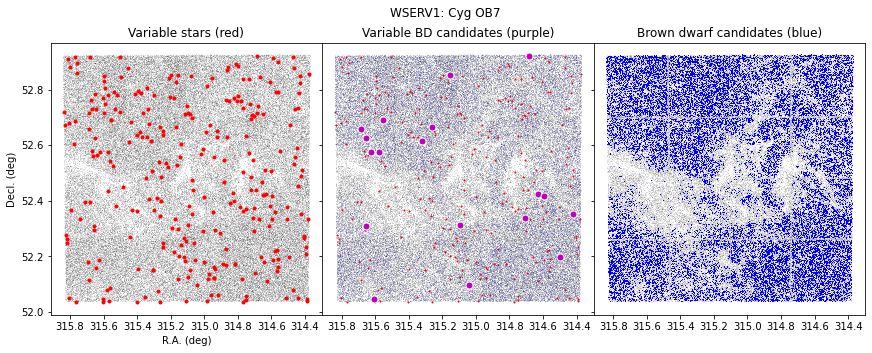

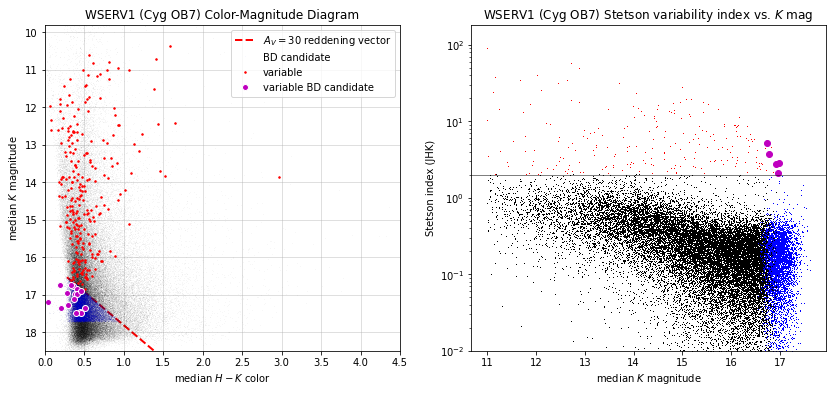

WSERV5 Q1 brown dwarf candidates: 3646
WSERV5 Q1 brown dwarf candidates that are variable: 64
WSERV5 Q1 variables: 452



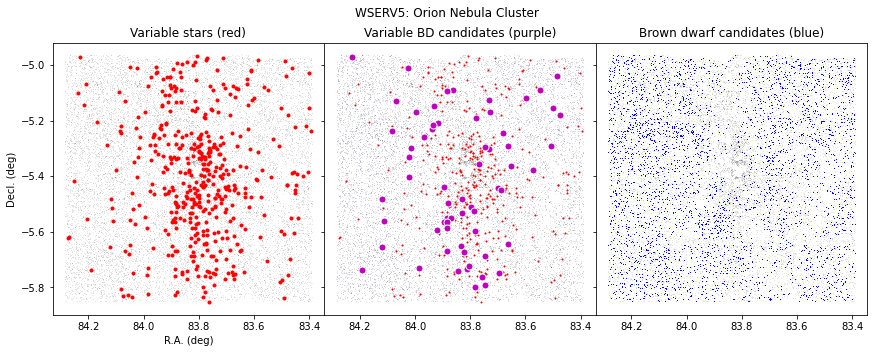

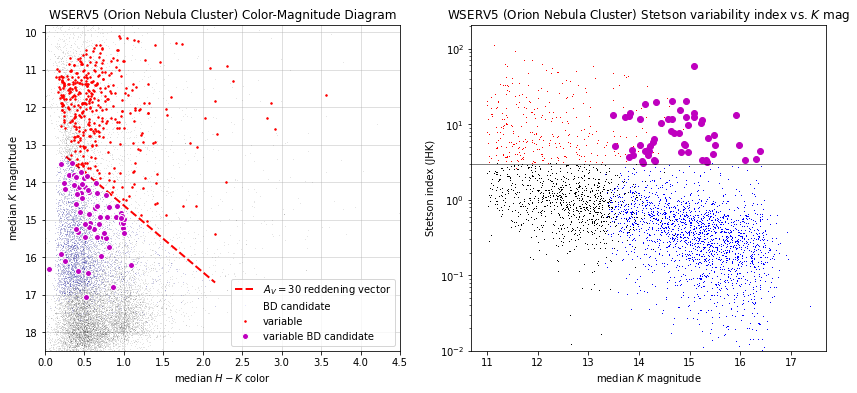

WSERV7 Q1 brown dwarf candidates: 5925
WSERV7 Q1 brown dwarf candidates that are variable: 36
WSERV7 Q1 variables: 86



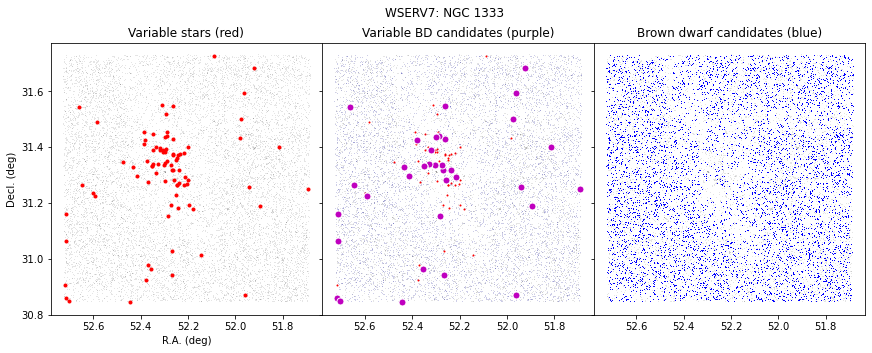

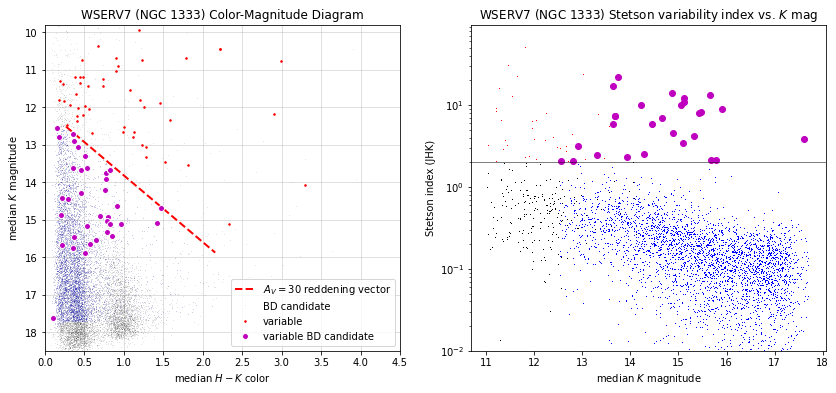

WSERV8 Q1 brown dwarf candidates: 7000
WSERV8 Q1 brown dwarf candidates that are variable: 16
WSERV8 Q1 variables: 147



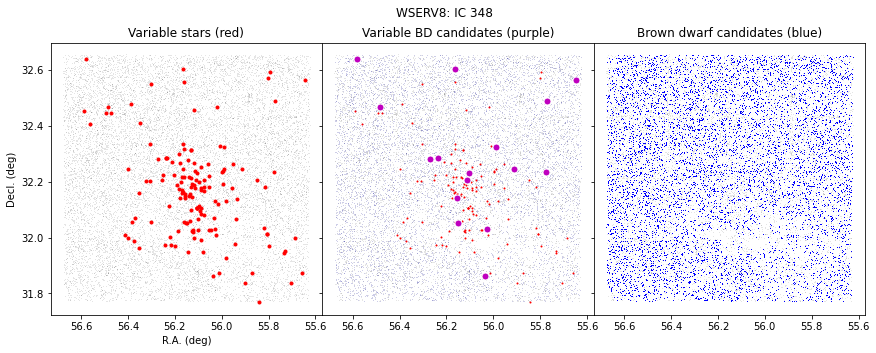

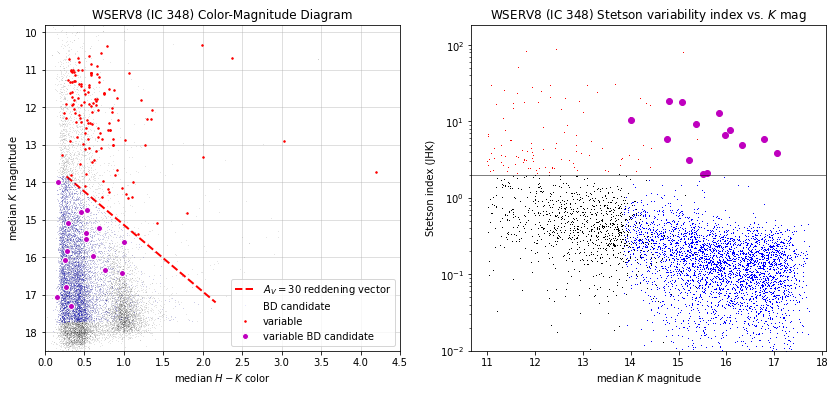

WSERV11 Q1 brown dwarf candidates: 7978
WSERV11 Q1 brown dwarf candidates that are variable: 5
WSERV11 Q1 variables: 245



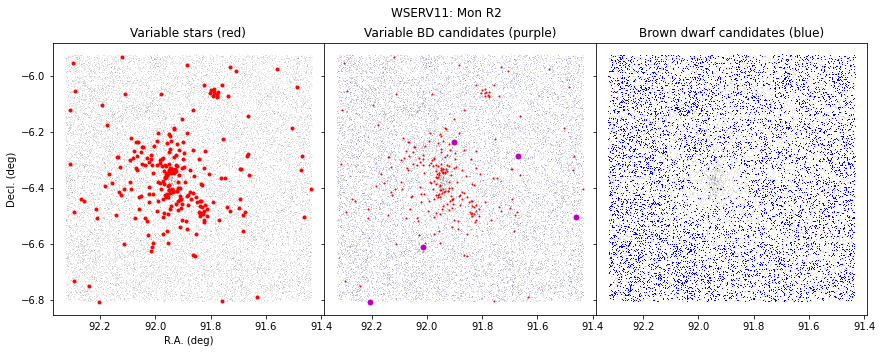

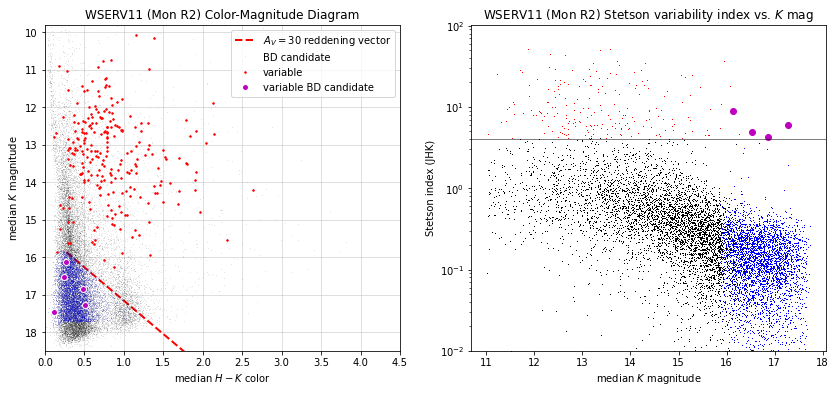

In [14]:
wserv_ids = [1, 5, 7, 8, 11]

# n_obs_list = [130, 120, 171, 85, 110]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

min_Stetson_list = [2, 3, 2, 2, 4]

SFR_names = ["Cyg OB7", "Orion Nebula Cluster", "NGC 1333", "IC 348", "Mon R2"]
SFR_dict = {x: y for x, y in zip(wserv_ids, SFR_names)}

for wserv, n_min, n_max, S in list(zip(wserv_ids, n_min_list, n_max_list, min_Stetson_list)):
    
    ds = spread[f'wserv{wserv}']

    q0 = sq0(ds, n_min, n_max)
    q1 = sq1(ds, n_min, n_max)
    q2 = sq2(ds, n_min, n_max)
    
    v0 = sq0_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v1 = sq1_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v2 = sq2_variables(ds, n_min, n_max, Stetson_cutoff=S)
    
    bd = simple_BD_select_v2(ds, wserv)

    
    fig, axes = plt.subplots(ncols=3, figsize=(14.6,5), sharex=True, sharey=True)
    
    for ax in axes:
        
        ax.plot(np.degrees(ds[q0]['mean']['RA']), np.degrees(ds[q0]['mean']['DEC']), 'k,', alpha=0.1)
        ax.invert_xaxis()
        
    axes[0].plot(np.degrees(ds[v1]['mean']['RA']), np.degrees(ds[v1]['mean']['DEC']), 'r.')

    axes[1].plot(np.degrees(ds[v1]['mean']['RA']), np.degrees(ds[v1]['mean']['DEC']), 'r.', ms=2)
    axes[1].plot(np.degrees(ds[q1 & bd]['mean']['RA']), np.degrees(ds[q1 & bd]['mean']['DEC']), 'b,', alpha=0.1)
    axes[1].plot(np.degrees(ds[v1 & bd]['mean']['RA']), np.degrees(ds[v1 & bd]['mean']['DEC']), 'mo', markeredgecolor='w', ms=7)

    axes[2].plot(np.degrees(ds[q1 & bd]['mean']['RA']), np.degrees(ds[q1 & bd]['mean']['DEC']), 'b,')
    
    fig.suptitle(f"WSERV{wserv}: {SFR_dict[wserv]}")
    
    axes[0].set_title("Variable stars (red)")
    axes[1].set_title("Variable BD candidates (purple)")
    axes[2].set_title("Brown dwarf candidates (blue)")
    
    axes[0].set_xlabel("R.A. (deg)")
    axes[0].set_ylabel("Decl. (deg)")

    plt.subplots_adjust(wspace=0)
    
    
    # rieke & lebofsky 1985 reddening law
    A_K = 0.112
    A_H = 0.175
    E_HK = A_H - A_K # this is like a slope in color-mag space
    
    J_BDlimit = apparent_BD_mags_jhk[wserv][0]
    H_BDlimit = apparent_BD_mags_jhk[wserv][1]
    K_BDlimit = apparent_BD_mags_jhk[wserv][2]

    fig2, (ax, ax2) = plt.subplots(ncols=2, figsize=(14,6))
    
    h = ds['median']['HAPERMAG3']
    k = ds['median']['KAPERMAG3']
    hmk = h-k
    
    h_e = ds['median']['HAPERMAG3ERR']
    k_e = ds['median']['KAPERMAG3ERR']
    hmk_e = (h_e**2 + k_e**2)**0.5
    
    hmk_limit = 19 - k
    no_h = np.isnan(ds['median']['HAPERMAG3'])
    
    ee = (hmk_e<1) & (k_e<1)

    ax.plot(
        [H_BDlimit-K_BDlimit, (H_BDlimit-K_BDlimit) + E_HK*30],
        [K_BDlimit, K_BDlimit + A_K*30],
        'r--', lw=2,
        label='$A_V=30$ reddening vector',
        scalex=False,
        scaley=False
    )
    
    if wserv == 1:
        asc = 0.03
    else:
        asc = 0.1
    
    
    ax.plot(hmk[q0], k[q0], 'k,', alpha=asc)
    ax.plot(hmk[q1 & bd], k[q1 & bd], 'b,', alpha=asc, label='BD candidate')
    ax.plot(hmk[v1], k[v1], 'r.', alpha=1, label='variable', ms=3)
    ax.plot(hmk[v1&bd], k[v1&bd], 'mo', alpha=1, label='variable BD candidate', markeredgecolor='w')
#     ax.plot(hmk_limit[v1 & no_h], k[v1 & no_h], 'g>', alpha=1, label='too faint at H: upper limits on H-K')
    
    print(f"WSERV{wserv} Q1 brown dwarf candidates: {np.sum(q1&bd)}")
    print(f"WSERV{wserv} Q1 brown dwarf candidates that are variable: {np.sum(v1&bd)}")
    print(f"WSERV{wserv} Q1 variables: {np.sum(v1)}")
    print()
    ax.legend()
    ax.grid(True, alpha=0.5)
    
    ax.set_xlabel("median $H-K$ color")
    ax.set_ylabel("median $K$ magnitude")
    ax.set_title(f"WSERV{wserv} ({SFR_dict[wserv]}) Color-Magnitude Diagram")

    ax.set_xlim(0, 4.5)
    ax.set_ylim(18.5, 9.8)
    
    ax2.plot(ds[q2]['median']['KAPERMAG3'], ds[q2]['variability']['Stetson_JHK'], 'k,')
    ax2.plot(ds[q2 & bd]['median']['KAPERMAG3'], ds[q2 & bd]['variability']['Stetson_JHK'], 'b,')
    ax2.plot(ds[q2 & v2]['median']['KAPERMAG3'], ds[q2 & v2]['variability']['Stetson_JHK'], 'r,')
    ax2.plot(ds[bd & v2]['median']['KAPERMAG3'], ds[bd & v2]['variability']['Stetson_JHK'], 'mo')
    ax2.semilogy()
    ax2.axhline(S, color='k', lw=1, alpha=0.5)
    ax2.set_ylim(1e-2, None)
    ax2.set_ylabel("Stetson index (JHK)")
    ax2.set_xlabel("median $K$ magnitude")

    ax2.set_title(f"WSERV{wserv} ({SFR_dict[wserv]}) Stetson variability index vs. $K$ mag")


    plt.show()
    

/Users/tsrice/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:136: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order, subok=True)
/Users/tsrice/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/Users/tsrice/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_asarray.py:136: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order, subok=True)
/Users/tsrice/Documents/Variability_Project_2020/wuvars/plotting/lightcurve.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10, 6), dpi=80, facec

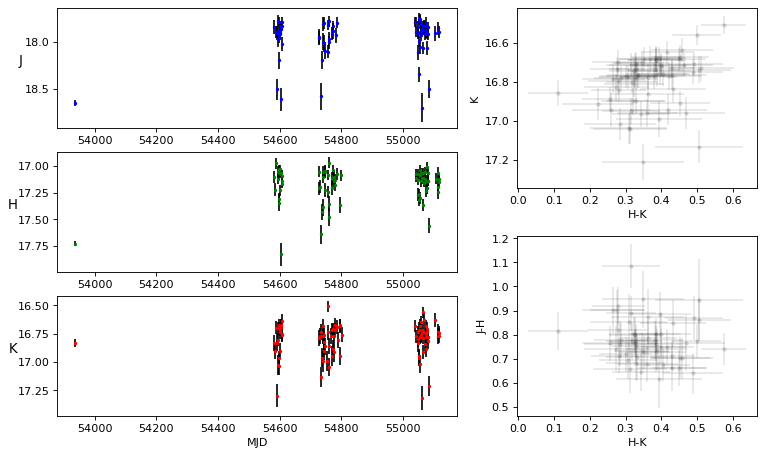

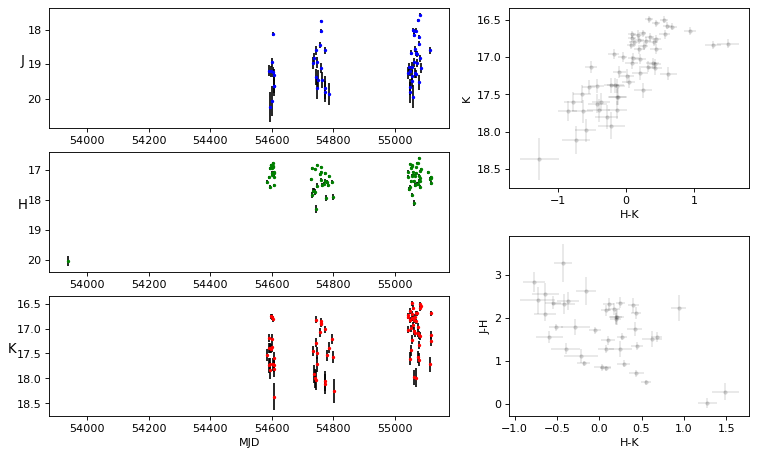

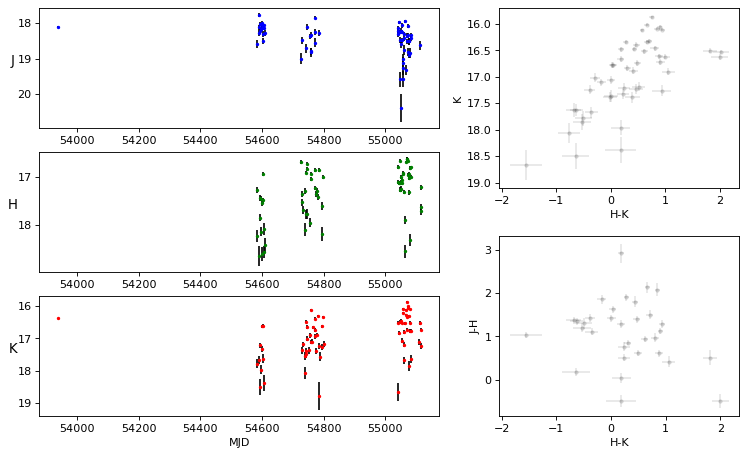

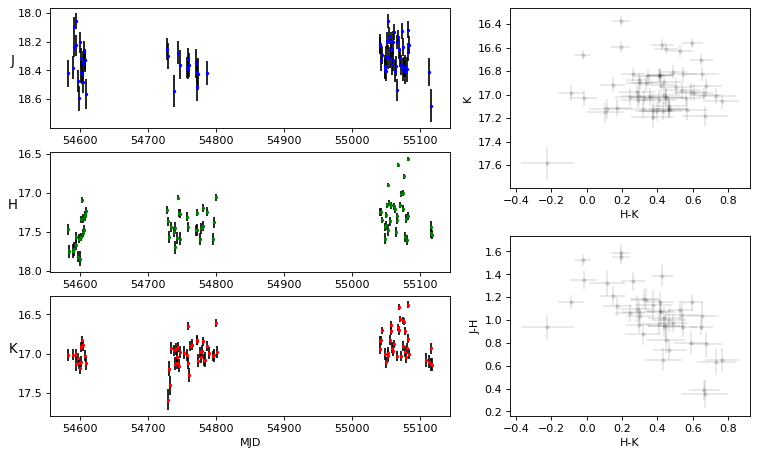

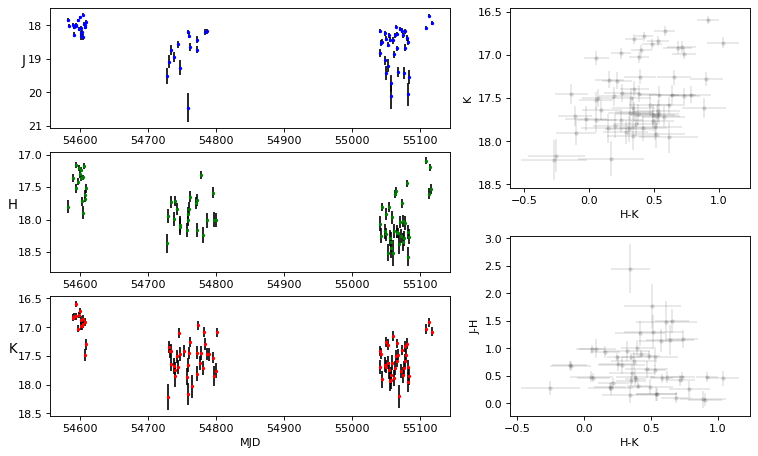

...

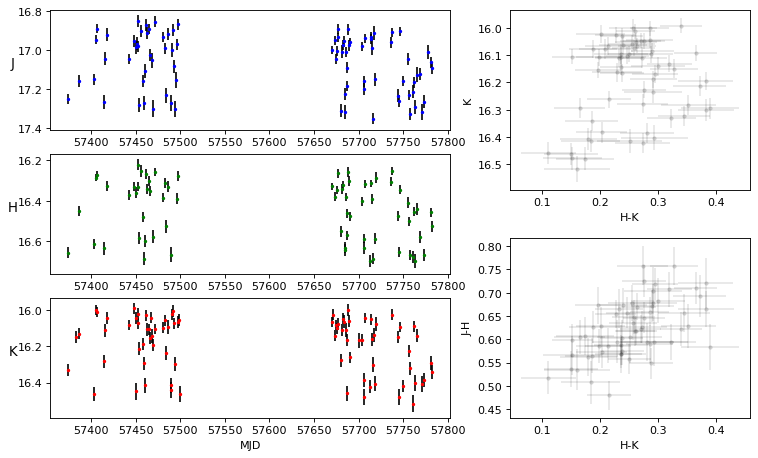

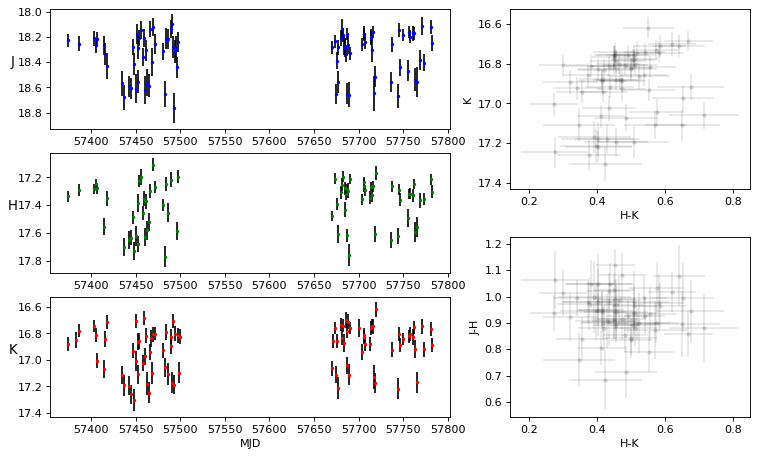

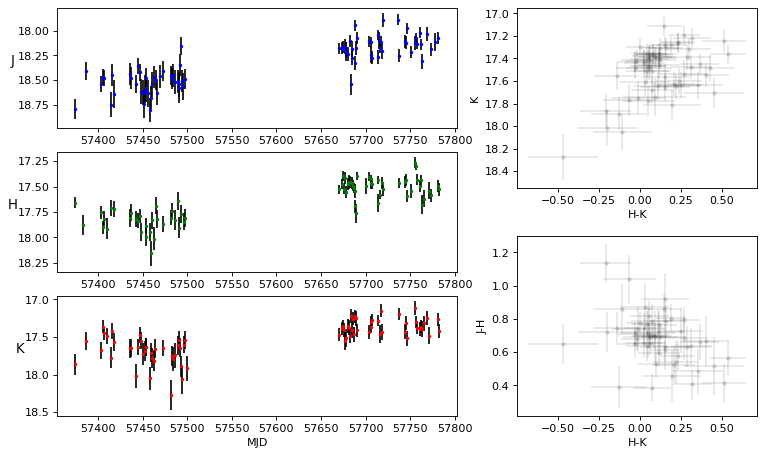

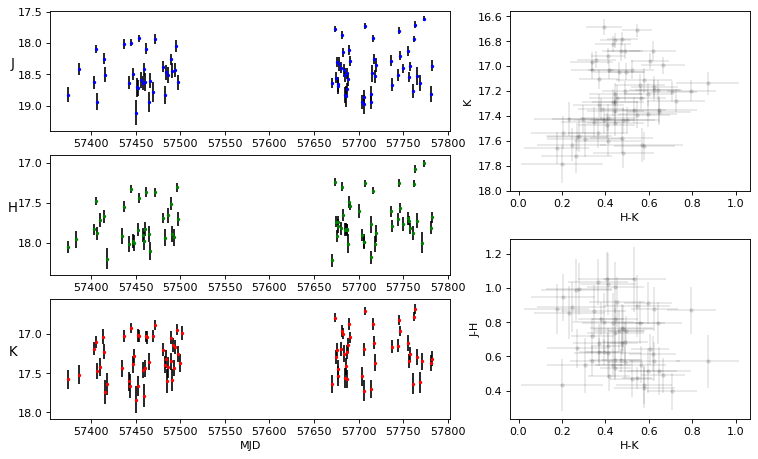

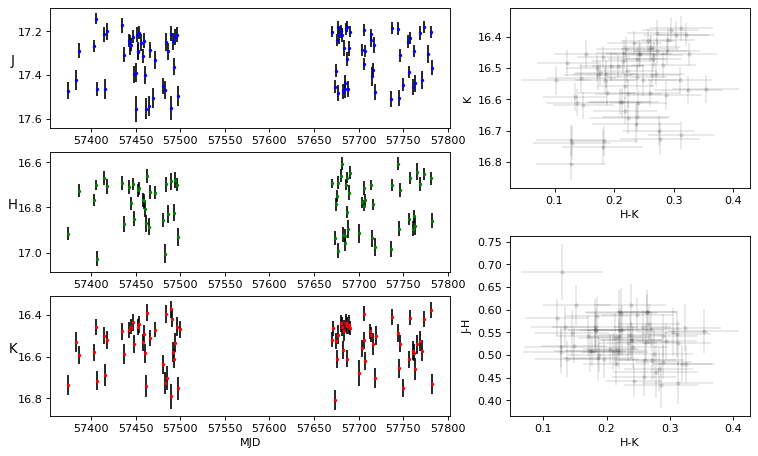

In [4]:
# let's make some lightcurves!

#     sourceids = ds[v_k_only].index

from wuvars.plotting.lightcurve import simple_lc

wserv_ids = [1, 5, 7, 8, 11]

# n_obs_list = [130, 120, 171, 85, 110]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

min_Stetson_list = [2, 3, 2, 2, 4]

SFR_names = ["Cyg OB7", "Orion Nebula Cluster", "NGC 1333", "IC 348", "Mon R2"]
SFR_dict = {x: y for x, y in zip(wserv_ids, SFR_names)}

for wserv, n_min, n_max, S in list(zip(wserv_ids, n_min_list, n_max_list, min_Stetson_list)):
    
    ds = spread[f'wserv{wserv}']
    dat = phot_grouped[f'wserv{wserv}']

    q0 = sq0(ds, n_min, n_max)
    q1 = sq1(ds, n_min, n_max)
    q2 = sq2(ds, n_min, n_max)
    
    v0 = sq0_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v1 = sq1_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v2 = sq2_variables(ds, n_min, n_max, Stetson_cutoff=S)
    
    bd = simple_BD_select_v2(ds, wserv)

    sourceids = ds[v1 & bd].index
        
    for i, sid in enumerate(sourceids):
    
        fig = simple_lc(dat, sid)
        fig.savefig(f"BD_lcs_v1/WSERV{wserv}_BD{i}_sid{sid}.png")
        
    

In [6]:
import matplotlib.pyplot as plt
plt.errorbar?

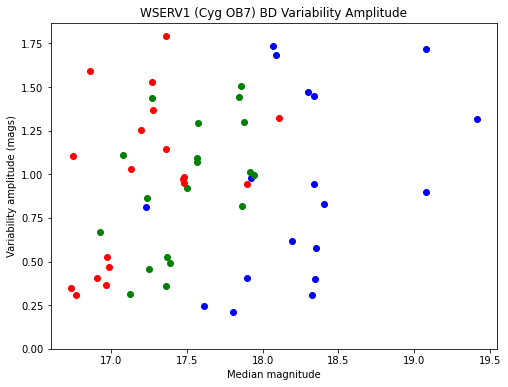

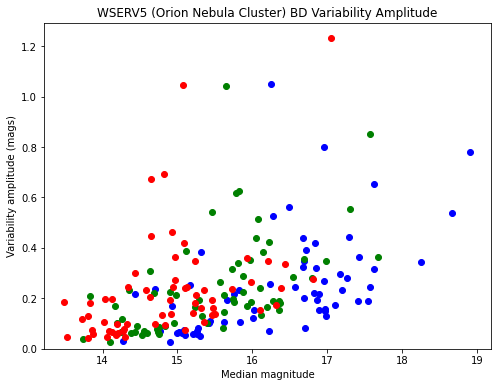

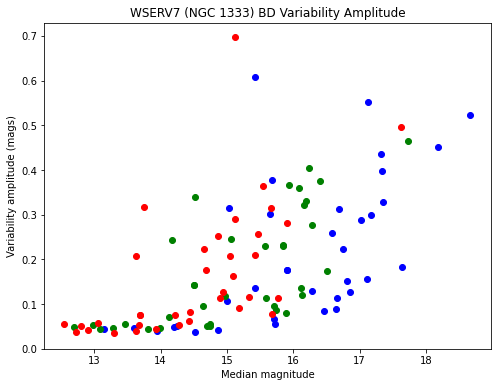

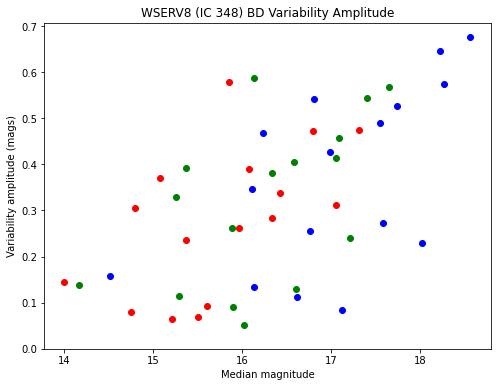

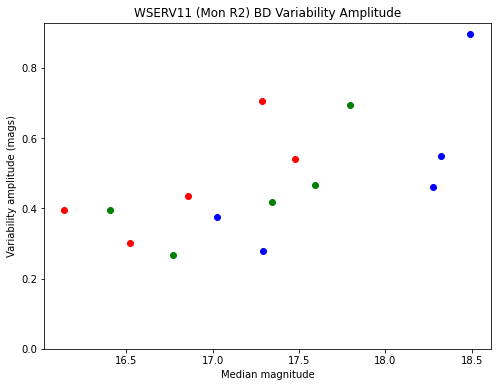

In [12]:
wserv_ids = [1, 5, 7, 8, 11]

# n_obs_list = [130, 120, 171, 85, 110]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

min_Stetson_list = [2, 3, 2, 2, 4]

SFR_names = ["Cyg OB7", "Orion Nebula Cluster", "NGC 1333", "IC 348", "Mon R2"]
SFR_dict = {x: y for x, y in zip(wserv_ids, SFR_names)}

for wserv, n_min, n_max, S in list(zip(wserv_ids, n_min_list, n_max_list, min_Stetson_list)):
    
    ds = spread[f'wserv{wserv}']

    q0 = sq0(ds, n_min, n_max)
    q1 = sq1(ds, n_min, n_max)
    q2 = sq2(ds, n_min, n_max)
    
    v0 = sq0_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v1 = sq1_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v2 = sq2_variables(ds, n_min, n_max, Stetson_cutoff=S)
    
    bd = simple_BD_select_v2(ds, wserv)

    fig, ax = plt.subplots(1, figsize=(8, 6))
    
    ax.plot(ds[v1 & bd]['median']['JAPERMAG3'], ds[v1 & bd]['range_9010']['JAPERMAG3'], 'bo')
    ax.plot(ds[v1 & bd]['median']['HAPERMAG3'], ds[v1 & bd]['range_9010']['HAPERMAG3'], 'go')
    ax.plot(ds[v1 & bd]['median']['KAPERMAG3'], ds[v1 & bd]['range_9010']['KAPERMAG3'], 'ro')
    
    ax.set_ylabel("Variability amplitude (mags)")
    ax.set_xlabel("Median magnitude")
    
    ax.set_ylim(0, None)
    ax.set_title(f"WSERV{wserv} ({SFR_dict[wserv]}) BD Variability Amplitude")

    plt.show()
    

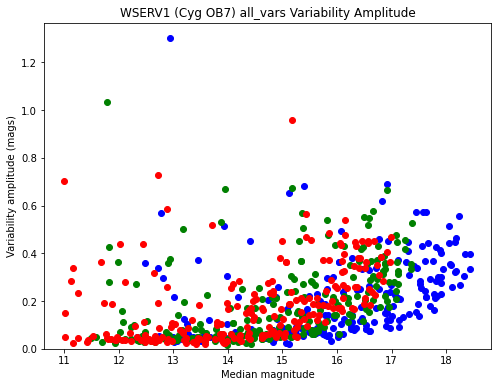

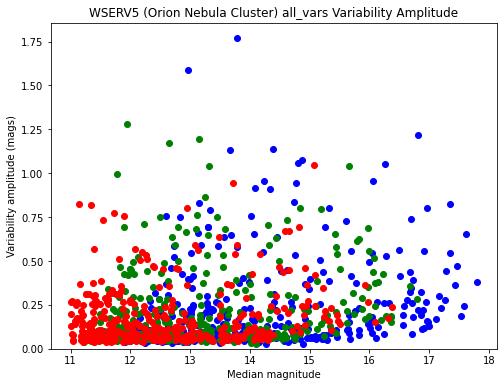

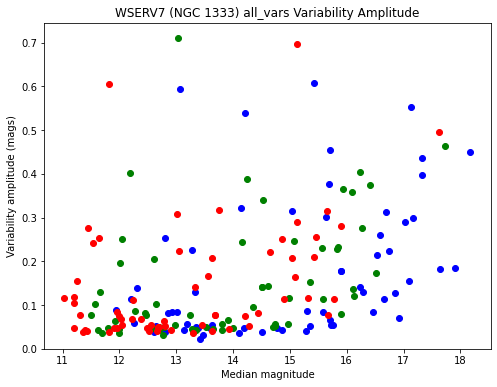

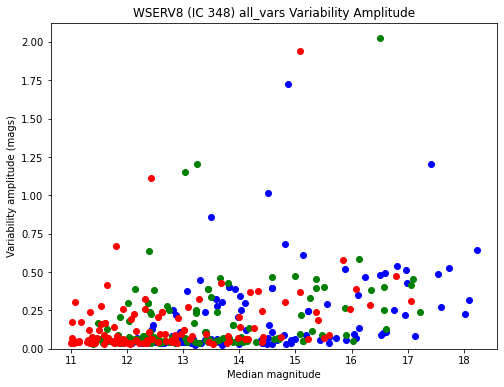

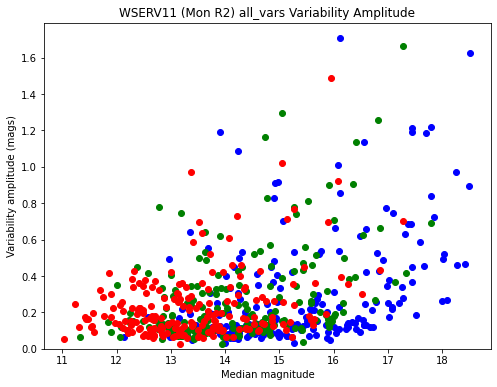

In [13]:
wserv_ids = [1, 5, 7, 8, 11]

# n_obs_list = [130, 120, 171, 85, 110]

n_min_list = [60, 35, 80, 55, 65]
n_max_list = [100, 90, 160, 80, 100]

min_Stetson_list = [2, 3, 2, 2, 4]

SFR_names = ["Cyg OB7", "Orion Nebula Cluster", "NGC 1333", "IC 348", "Mon R2"]
SFR_dict = {x: y for x, y in zip(wserv_ids, SFR_names)}

for wserv, n_min, n_max, S in list(zip(wserv_ids, n_min_list, n_max_list, min_Stetson_list)):
    
    ds = spread[f'wserv{wserv}']

    q0 = sq0(ds, n_min, n_max)
    q1 = sq1(ds, n_min, n_max)
    q2 = sq2(ds, n_min, n_max)
    
    v0 = sq0_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v1 = sq1_variables(ds, n_min, n_max, Stetson_cutoff=S)
    v2 = sq2_variables(ds, n_min, n_max, Stetson_cutoff=S)
    
    bd = simple_BD_select_v2(ds, wserv)

    fig, ax = plt.subplots(1, figsize=(8, 6))
    
    ax.plot(ds[v2]['median']['JAPERMAG3'], ds[v2]['range_9010']['JAPERMAG3'], 'bo')
    ax.plot(ds[v2]['median']['HAPERMAG3'], ds[v2]['range_9010']['HAPERMAG3'], 'go')
    ax.plot(ds[v2]['median']['KAPERMAG3'], ds[v2]['range_9010']['KAPERMAG3'], 'ro')
    
    ax.set_ylabel("Variability amplitude (mags)")
    ax.set_xlabel("Median magnitude")
    
    ax.set_ylim(0, None)
    ax.set_title(f"WSERV{wserv} ({SFR_dict[wserv]}) all_vars Variability Amplitude")

    plt.show()
    